In [1]:
import pandas as pd
import numpy as np
import os

In [2]:
df = pd.read_csv(os.path.join('data', 'nyc_energy_data.csv')).drop('Unnamed: 0', axis=1)

### Data Cleaning

In [3]:
df.dtypes

timeStamp                  object
demand                    float64
lat                       float64
long                      float64
new_datetime               object
temperature               float64
precipTime                float64
precipDepth               float64
snowDepth                 float64
precipDepth/precipTime    float64
dtype: object

In [4]:
df['timeStamp'] = pd.to_datetime(df.timeStamp)
df['new_datetime'] = pd.to_datetime(df.new_datetime)

We know that the data correponds to only one specific location; there is only one point location - (lat, long) pair

In [5]:
df_len = len(df)
lat_info = df.lat.value_counts()
long_info = df.long.value_counts()

In [6]:
if ((lat_info.index.size == 1) & (lat_info.values == df_len)):
    print(f'Only one unique Lat value exists: {lat_info.index[0]} & is equal to rows in df')
if ((long_info.index.size == 1) & (long_info.values == df_len)):
    print(f'Only one unique Long value exists: {long_info.index[0]} & is equal to rows in df')

Only one unique Lat value exists: 40.701 & is equal to rows in df
Only one unique Long value exists: -74.009 & is equal to rows in df


We will proceed wth dropping the lat and long columns

In [7]:
df.drop(['lat', 'long'], axis=1, inplace=True)
(df.timeStamp == df.new_datetime).sum() == len(df)

True

#### Deal with Missing Values

In [8]:
df.isnull().sum()

timeStamp                  0
demand                    81
new_datetime               0
temperature                0
precipTime                48
precipDepth               48
snowDepth                  0
precipDepth/precipTime    48
dtype: int64

The following cell block checks for missing rows in the data i.e. rows corresponding to datetime period that is missing from the date range given the hourly frequency 

In [9]:
def check_missing_records(df, datetime_col, freq):
    '''
    Creates a DatFrame with missing datetime rows (if any) added & missing rows info. 
    Args:
        df: the dataframe with potentially missing datetime rows.
        datetime_col: the name of the datetime column in the df to check missing periods. 
    Returns:
        the reconstituted df with missing rows added back.
    '''
    hold = pd.date_range(start=df[datetime_col].min(),end=df[datetime_col].max(),freq=freq)
    hold = pd.DataFrame(hold, columns=['datetime'])
    reconstituted_df = pd.merge(hold, df, how='left', left_on='datetime', right_on=datetime_col)
    missing_datetime_info = reconstituted_df.isnull().sum()
    return reconstituted_df, missing_datetime_info

In [10]:
new_df, missing_rows_info = check_missing_records(df, 'new_datetime', 'H')

In [11]:
missing_rows_info

datetime                   0
timeStamp                  2
demand                    83
new_datetime               2
temperature                2
precipTime                50
precipDepth               50
snowDepth                  2
precipDepth/precipTime    50
dtype: int64

In [12]:
df = new_df
new_df = None

In [13]:
def get_missing_info(df, datetime_col, value_col):
    # Get all datetime values for which data is missing and extracts unique date from it
    missing_dates = df[df[value_col].isnull()].sort_values(datetime_col)[datetime_col].dt.date.unique()
    # Get slice of data for timestamps that corresponds to the missing dates
    missing_df = df.loc[df[datetime_col].dt.date.isin(missing_dates)]
    # Get Demand column from above missing data & set new_datetime column as index 
    missing_data = missing_df.set_index(datetime_col)[[value_col]]
    return missing_data

In [14]:
missing_demand = get_missing_info(df, 'datetime','demand')

In [15]:
# Group missing demand data by dates and sum over all the missing values for that date
missing_demand.groupby(missing_demand.index.date).apply(lambda x: x.isnull().sum())

,demand
2012-03-11,1
2013-03-10,1
2014-03-09,1
2015-03-08,1
2015-03-11,1
2015-10-04,2
2016-01-28,4
2016-03-13,1
2016-04-20,1
2016-06-07,2


We can see that most dates have only a few timeblocks missing whereas the last few dates have almost more than half a day's worth of values missing. We will interpolate the former kind of missing values and process with dropping the rows corresponding to the last 3 dates. 
Often in practice such occurances are not that unusual for live data; recent values or values in recent past aren't avaliable due to technical issues. We are going to treat this case as such and continue.

In [16]:
df = df[~(df.timeStamp>=pd.to_datetime('2017-08-10'))].copy()
df.demand.interpolate(inplace=True)

In [17]:
df.isnull().sum()

datetime                   0
timeStamp                  2
demand                     0
new_datetime               2
temperature                2
precipTime                50
precipDepth               50
snowDepth                  2
precipDepth/precipTime    50
dtype: int64

In [18]:
missing_precip = get_missing_info(df, 'datetime', 'precipTime')
missing_precip.groupby(missing_precip.index.date).apply(lambda x: x.isnull().sum())

,precipTime
2014-01-17,24
2014-01-23,24
2016-03-13,1
2017-03-12,1


In [19]:
missing_snow = get_missing_info(df, 'datetime', 'snowDepth')

In [20]:
missing_snow = get_missing_info(df, 'datetime', 'snowDepth')
missing_snow.groupby(missing_snow.index.date).apply(lambda x: x.isnull().sum())

,snowDepth
2016-03-13,1
2017-03-12,1


In [21]:
# We will replace the Null Values found for Snow and precipitation variables with zero,
# assuming zero snowfall or rainfall for Null values
# We can also assume that for particular days there was a malfunction in the data acquisition or fetching pipeline  
df.fillna(0, inplace=True)

#### Let's have a quick look at the distribution of each variable

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

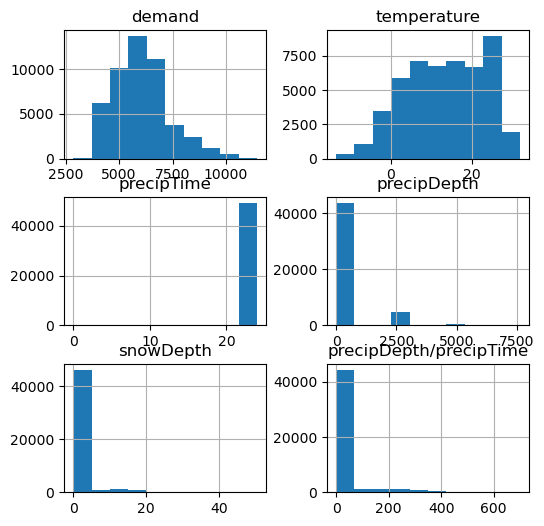

In [23]:
df.select_dtypes(include='number').hist(figsize=(6,6));

It does make sense that  weather variables that reflect snow or precipitation would show skewed distribution or values concentrated in a particular section or a bin. 

### Let's create some date time features

In [23]:
df['date'] = df.datetime.dt.date
df['time'] = df.datetime.dt.time

In [24]:
def create_datetime_features(df, *dt_attr, datetime_col='datetime'):
    '''This function creates date-time features from  datetime column in the DataFrame
        
        Args:
            df (pd.DataFrame): Pandas Dataframe with datetime Column
            dt_attr (args): args to take that can be used by datetime accessor
            datetime (str): Datetime Column Name  
        
        Returns:
            None: Adds New Columns that contain values created using datetime accessor 
    '''
    df[datetime_col] = pd.to_datetime(df[datetime_col])
    for a in dt_attr:
        if a == 'week':
            df[a] = df[datetime_col].dt.isocalendar().week
        else:
            df[a] = getattr(df[datetime_col].dt, a)

In [25]:
datetime_features = ['year', 'month', 'day', 'hour', 'day_of_week', 'day_of_year', 'weekday', 'week']

In [26]:
create_datetime_features(df, *datetime_features,  datetime_col='datetime')
df['weekend'] = df.weekday.apply(lambda x: 1 if x in [5,6] else 0)

We will use a module called workalendar to get the list of Holidays in NYC

In [27]:
from workalendar.usa.new_york import NewYork
cal = NewYork()
df['Holidays'] = df.datetime.apply(lambda x: 1 if cal.is_holiday(x) else 0)

In [28]:
from datetime import timedelta, date, time

In [29]:
df.sort_values('datetime', inplace=True)
df.set_index('datetime', inplace=True)

#### Holidays Analysis

In [31]:
holiday_dates = [i for i in df[df.Holidays==1].date.unique()]
holiday_date_vicinity = [(dt-timedelta(days=14), dt+timedelta(days=15)) for dt in holiday_dates[3:]]
holiday_window = iter(holiday_date_vicinity)

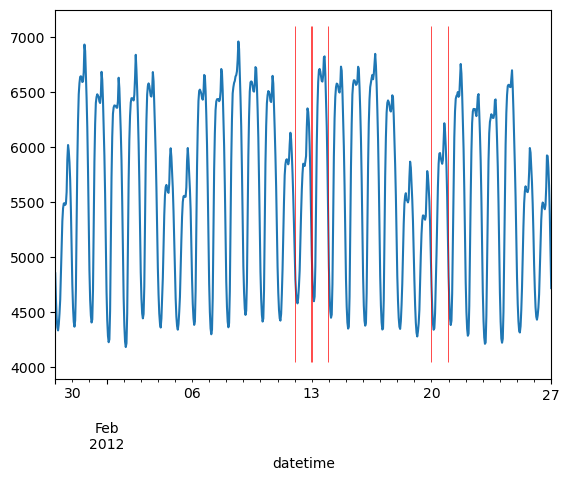

In [32]:
window = next(holiday_window)

data_slice = df.loc[window[0]:window[1]]
ax = data_slice.demand.plot()
time_slicer = ((data_slice.time==time(0,0))|(data_slice.time==time(23,0)))
holiday_slice = data_slice.loc[(data_slice.Holidays==1)&time_slicer].index
ymin, ymax = ax.get_ylim()
ax.vlines(x=holiday_slice, ymin=ymin, ymax=ymax-1, color='r', lw=0.5)

In [33]:
demand_pct_change = df.demand.pct_change(freq='D').dropna()*100
demand_pct_change = pd.DataFrame(demand_pct_change).join(df.Holidays)
# demand_pct_change['demand'] = df.demand
demand_pct_change['demand_level'] = pd.qcut(demand_pct_change.demand, [0, .10,  .90, 1.], 
                                            labels=['low', 'normal', 'high' ]
                                            )

In [34]:
from scipy.stats import chi2_contingency

In [35]:
def calculate_carmersV(series1, series2):
    '''This function helps us calculate Cramer's V stat for two variables series1 & series2'''
    contingency_table = pd.crosstab(series1, series2)
    chi2_stat, p_value, dof, expected = chi2_contingency(np.array(contingency_table), correction=False)
    print(f"chi2 : {chi2_stat}")
    print(f"p-value: {p_value}")
    print(f"Degrees of Freedom: {dof}")
    print("Expected Frequencies:\n",expected)
    n_obs = np.sum(np.array(contingency_table))
    min_dim = min(contingency_table.shape)-1
    cramersV_demand_pct = np.sqrt((chi2_stat/n_obs) / min_dim)
    return cramersV_demand_pct

[chi2 table](https://people.richland.edu/james/lecture/m170/tbl-chi.html)

In [36]:
cramersV_demand_pct = calculate_carmersV(demand_pct_change['demand_level'], demand_pct_change['Holidays'])

chi2 : 88.70198339908882
p-value: 5.47783615270738e-20
Degrees of Freedom: 2
Expected Frequencies:
 [[ 4740.19296532   172.80703468]
 [37919.61406937  1382.38593063]
 [ 4740.19296532   172.80703468]]


In [37]:
cramersV_demand_pct

0.04249150594714311

In [38]:
cramersV_demand = calculate_carmersV(pd.qcut(df.demand, [0, .10,  .90, 1.], 
                                             labels=['low', 'normal', 'high']
                                             ), 
                                     df['Holidays']
                                    )

chi2 : 102.60768896082365
p-value: 5.236286995138203e-23
Degrees of Freedom: 2
Expected Frequencies:
 [[ 4740.77148438   175.22851562]
 [37918.45703125  1401.54296875]
 [ 4740.77148438   175.22851562]]


In [39]:
cramersV_demand

0.045689810418280616

The point biserialr is a good statistic to get the measure of association between a categorical variable and a continuous varaible. In the following cels we will check the association between:
- Holidays and demand
- Holidays and percent change in demand

In [40]:
from scipy.stats import pointbiserialr

In [41]:
pb_demand_pct = pointbiserialr(demand_pct_change['Holidays'], demand_pct_change['demand'])
pb_demand_pct

SignificanceResult(statistic=0.013423371325118923, pvalue=0.0029267665742509913)

Looking at the result above we can say that the results are statistically significant given the p-value that there's a week positive relation between Holidays and Percent Change in Demand.

In [42]:
pb_demand = pointbiserialr(df['Holidays'], df['demand'])
pb_demand

SignificanceResult(statistic=-0.05825524209837176, pvalue=3.2116931890199293e-38)

Looking at the result above we can say that the results are statistically significant given the p-value that there's a negative relation between Holidays and Demand.

In [43]:
# Summar of Results
holidays_stats = pd.DataFrame({'Value': [pb_demand.statistic, pb_demand_pct.statistic, cramersV_demand, cramersV_demand_pct], 
                               'Stat': ["Point-Biserialr", "Point-Biserialr", "Cramer's V", "Cramer's V"]
                              }, 
                              index = ['Demand', 'Demand_pct', 'Demand_level', 'Demand_pct_level']
                              )
holidays_stats

,Value,Stat
Demand,-0.058255,Point-Biserialr
Demand_pct,0.013423,Point-Biserialr
Demand_level,0.045690,Cramer's V
Demand_pct_level,0.042492,Cramer's V


We can conclude that:
- there's no strong association between Holidays and level of demand or the level of percent change in demand;
- however a statistically significant association exists between demand values and holidays although the association between percent change in demand and holidays is weak.

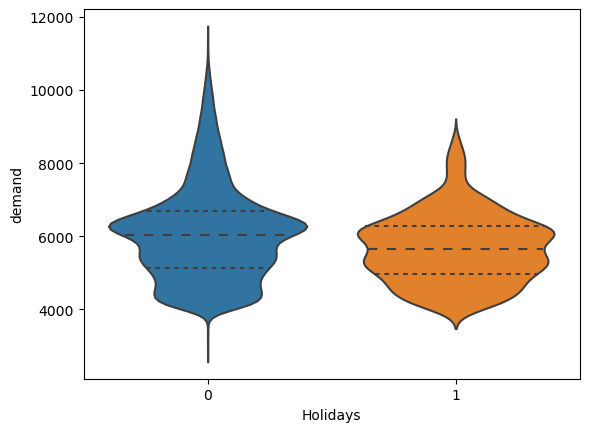

In [44]:
sns.violinplot(data = df, y='demand', x='Holidays', inner='quartiles');

### Some more EDA

Let's have a look at the Distribultion of Demand w.r.t. to different date & time variables.

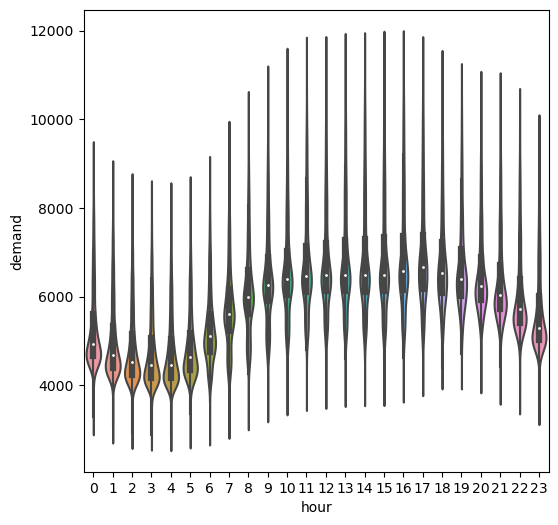

In [45]:
plt.figure(figsize=(6,6))
sns.violinplot(data=df, x='hour', y='demand')
plt.show()

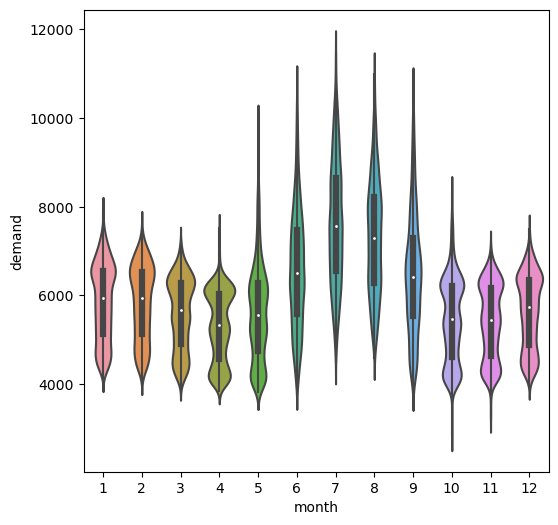

In [46]:
plt.figure(figsize=(6,6))
sns.violinplot(data=df, x='month', y='demand')
plt.show()

#### [sns multiple time series plot](https://seaborn.pydata.org/examples/timeseries_facets.html)

In [31]:
def create_sns_plot(df, x, y, col, hue, units):
    """
    Return the grid plot timeseries grouped by col, hue and unit.

    Parameter
    ---------
    df : pd.DataFrame
        Dataframe used to plot the grid.
    x : str
        column Name of X axis in each of the plots part of the grid.
    y : str
        column Name of Y axis in each of the plots part of the grid.
    col : str
        column Name of Variable used to separate the plots.
    hue : str
        column Name of Variable used to group the relplot.
    units : str
        column Name of Variable used to group the lineplot.

    Returns
    -------
    seaborn.FacetGrid
        FacetGrid for multiple time series.
    """

    sns.set_theme(style="dark")
    g = sns.relplot(
        data=df,
        x=x, y=y, col=col, hue=hue,
        kind="line", palette="crest", linewidth=4, 
        # zorder=5,
        col_wrap=3, 
        height=2, 
        aspect=1.5, 
        legend=False,
    )

    for fig, ax in g.axes_dict.items():

        ax.text(.8, .85, fig, transform=ax.transAxes, fontweight="bold")

        sns.lineplot(
            data=df, x=x, y=y, units=units,
            estimator=None, color=".7", linewidth=1, ax=ax,
        )

    # Reduce the frequency of the x axis ticks
    ax.set_xticks(ax.get_xticks()[::2])

    # Tweak the supporting aspects of the plot
    g.set_titles("")
    g.set_axis_labels("", "Demand")
    g.tight_layout()

#### Plot of Demand versus months segregated by Each Hour

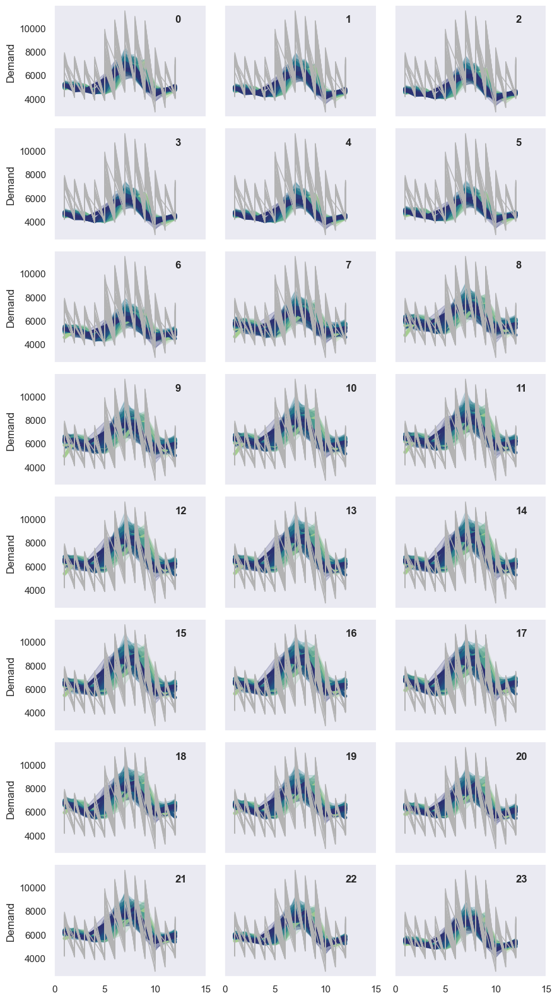

In [37]:
create_sns_plot(df, 'month', 'demand', 'hour', 'day', 'day')

#### A few more grid plots for demand sliced and grouped by different date-time variables

The following cell creates a dictionary of values to map each plot generated by a particluar grouping to a coordinate in the subplot

In [48]:
nrow, ncol = 3, 4
count = 1
ar_coord = {}
for r in range(nrow):
    for c in range(ncol):
        ar_coord[count] = (r,c)
        count+=1

In [49]:
color = sns.color_palette("crest", n_colors=48)

##### Plot of Demand for each day as it varies over different hours in a given Month

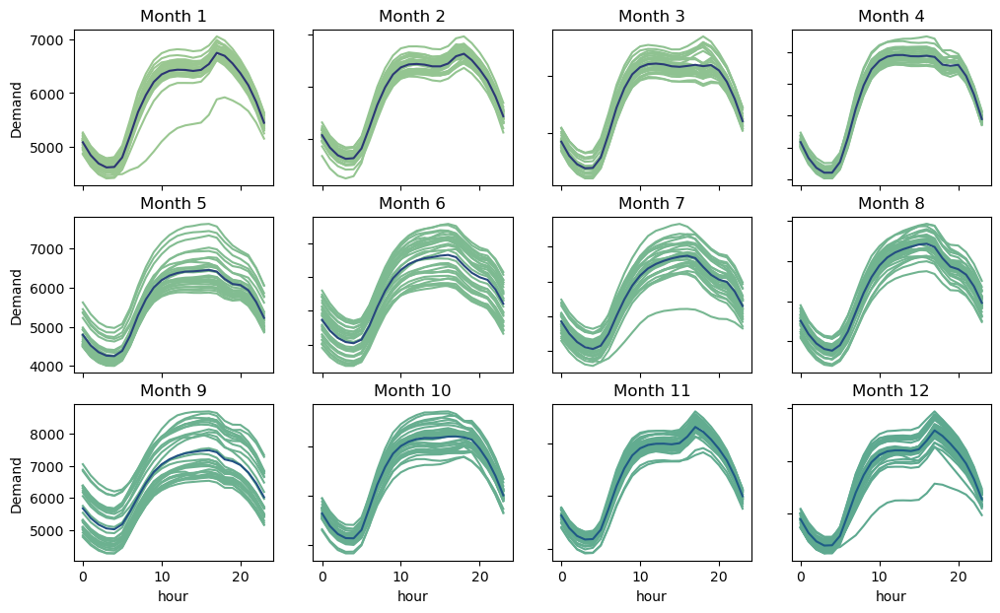

In [50]:
fig, axes = plt.subplots(nrow, ncol, figsize=(12, 7))
for i in range(1, 13):
    ax_coord = ar_coord[i]
    pivot_df = pd.pivot_table(df[df.month==i], index='hour', columns='day', values='demand', margins=True, margins_name='mean')
    pivot_df.drop('mean', inplace=True)
    pivot_df.drop('mean', axis=1).plot(title=f'Month {i}', legend=False, ax=axes[ax_coord[0],ax_coord[1]], sharex=True, sharey=True, color=color[i])
    pivot_df[['mean']].plot(legend=False, ax=axes[ax_coord[0],ax_coord[1]], sharex=True, sharey=True, color=color[-i])
plt.setp(axes[:, 0], ylabel='Demand')
plt.show()

##### Plot of Demand for each hour as it varies over different days in a given Month

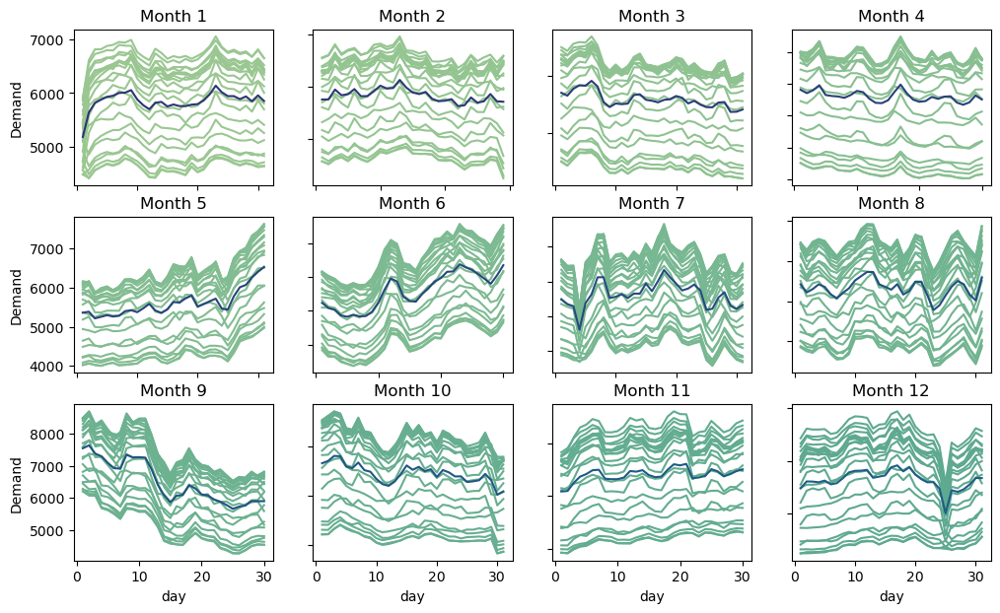

In [49]:
fig, axes = plt.subplots(nrow, ncol, figsize=(12, 7))
for i in range(1, 13):
    ax_coord = ar_coord[i]
    pivot_df = pd.pivot_table(df[df.month==i], index='day', columns='hour', values='demand', margins=True, margins_name='mean')
    pivot_df.drop('mean', inplace=True)
    pivot_df.drop('mean', axis=1).plot(title=f'Month {i}' ,legend=False, ax=axes[ax_coord[0],ax_coord[1]], color=color[i])
    pivot_df[['mean']].plot(legend=False, ax=axes[ax_coord[0],ax_coord[1]], sharex=True, sharey=True, color=color[-i])
plt.setp(axes[:, 0], ylabel='Demand')
plt.show()

#### Some More plots
You may uncomment the cells to get a few more plots

In [115]:
# create_sns_plot(x="hour", y="demand", col="month", hue="day", units="day")

In [116]:
# create_sns_plot(x="day", y="demand", col="month", hue="hour", units="hour")

In [117]:
# create_sns_plot(x="hour", y="demand", col="day_of_week", hue="week",  units="week")

In [118]:
# create_sns_plot(x="hour", y="demand", col="week", hue="day",  units="day")

#### Multivariate EDA

In [30]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [56]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=df.index, y=df['demand'], name="demand"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=df.index, y=df['temperature'], name="temperature"),
    secondary_y=True,
)

In [57]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=df.index, y=np.log(df['demand']), name="demand"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=df.index, y=df['precipDepth'], name="precipDepth"),
    secondary_y=True,
)

We can immediately see that the precipiation values in the later period in our date seems to either follow a different distribution altogether or has some very erroneous values. This might have happened due to issues with the enrichment methods provide by azureml-opendataset module.
Just to stay on the safe side we will not use these variables in this notebook. However getting access to good precipitation data for subsequent rounds of analysis would defiitely be the way forward and would help with accuracy.

###  Statistical Analysis
To analyse trend & seasonality: We will use statsmodels seasonal decomposition function to extract trend and seasonality of our time series. However its important to note that the time series has to be stationary for this analysis.

In [31]:
from statsmodels.tsa.seasonal import seasonal_decompose

##### Daily Seasonailty

In [32]:
pd.infer_freq(df.index)

'H'

In [52]:
decomp_daily = seasonal_decompose(df['demand'], model='multiplicative', period=24)

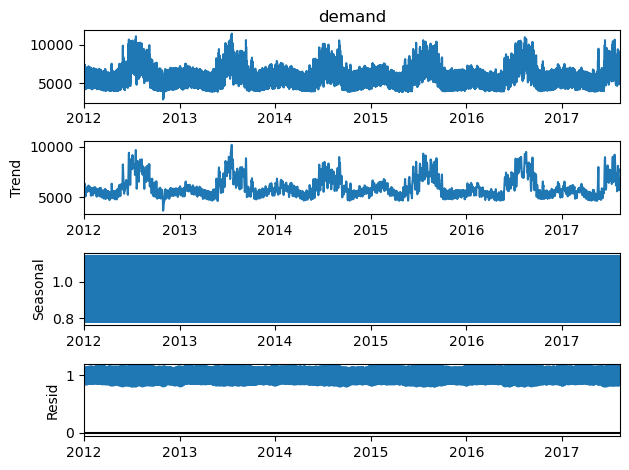

In [54]:
decomp_daily.plot();

In [33]:
class plotwindow:
    '''
    Helps visualise a time window of seasonal and residual components by iterating over a date range. 
    '''

    def __init__(self, decomp, freq):
        '''
        Init Function. 
        Args:
            decomp: the result returned by statsmodels seasonal decompose function.
            freq: the date range to iterate over. 
        Returns:
            Initializes the class for iterative plotting plot of seasonal and residual components.
        '''
        self.get_date_range(decomp, freq)
        self.right_dt_bound = self.date_range[1:]
        self.left_dt_bound = self.date_range[:-1]
        self.strafe = zip(self.left_dt_bound, self.right_dt_bound)
        self.seasonal_df = pd.DataFrame(decomp.seasonal)
        self.residual_df = pd.DataFrame(decomp.resid)

    def get_date_range(self, decomp, freq):
        st = decomp.observed.index.min()
        en = decomp.observed.index.max()
        self.date_range = pd.date_range(start=st, end=en, freq=freq)

    def plot(self):
        '''
        Plots the Components. 
        Args:
            self: Takes args initialized by the Class.
        Returns:
            plots the next window of seasonal and residual components.
        '''
        next_window = next(self.strafe)
        ax = self.seasonal_df.loc[next_window[0]:next_window[1], :].plot(sharey=False)
        self.residual_df.loc[next_window[0]:next_window[1], :].plot(ax=ax, sharey=False)
        plt.show()

In [56]:
plt_window = plotwindow(decomp_daily, str(24*7)+'H')

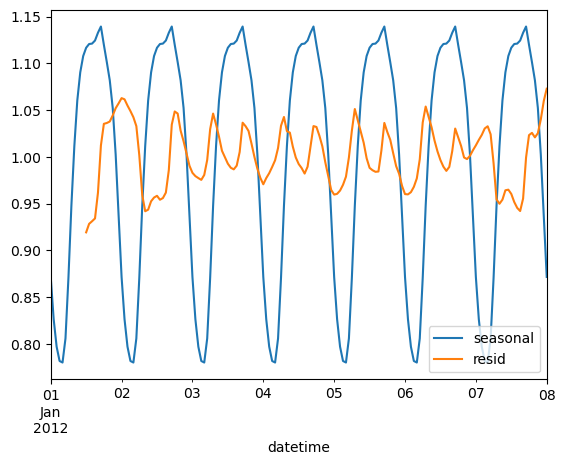

In [57]:
plt_window.plot()

#### We first need to check if the series is stationary before we inspect the ACF & PACF plots to understand the kind of process the time series is; this will help us analyse the auto-regressive and moving average components.

In [34]:
from statsmodels.tsa.stattools import adfuller

In [35]:
def get_adf(ts):
    '''Calculates and Prints augmented dickey-fuller statistic for a time series ts'''
    result = adfuller(ts)
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {result[1]}')
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

In [60]:
get_adf(df['demand'])

ADF Statistic: -10.880378058072859
p-value: 1.2993764161839394e-19
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


**The time series is stationary** as the p-value is less than 0.05 & ADF statistic value is also less than value at significance level of 1% (**99% confidence**).

In [36]:
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf

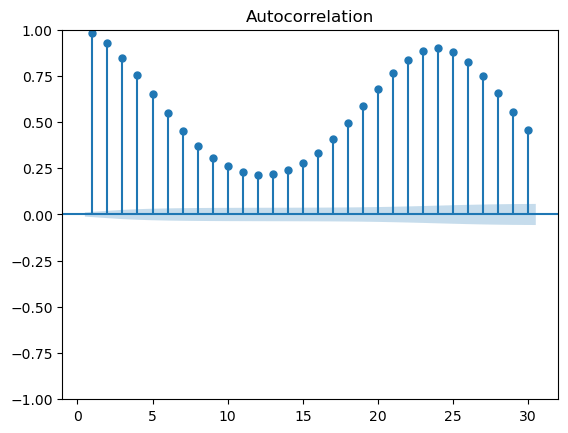

In [62]:
plot_acf(df.demand, lags=30, zero=False, alpha=0.01);

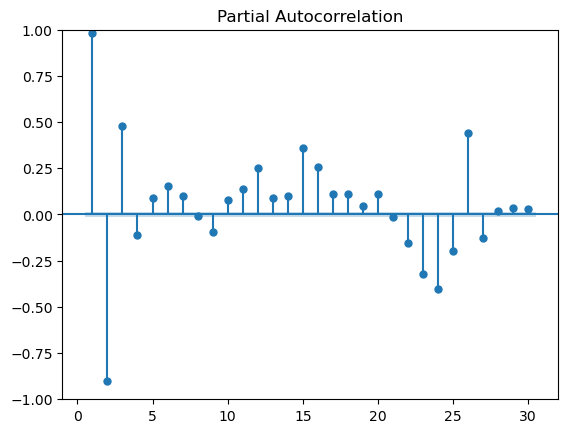

In [63]:
plot_pacf(df.demand, lags=30, zero=False, method='ywm', alpha=0.01);

In [64]:
# let's check if the seasonal component is stationary
get_adf(decomp_daily.seasonal)

ADF Statistic: 6.857320660449608e-10
p-value: 0.9585320861167655
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


**The time series is not stationary** as the p-value is greater than 0.05
We therefore proceed with differencing the series to make it stationary.

In [65]:
get_adf(decomp_daily.seasonal.diff(1).dropna())

ADF Statistic: -1416967461149047.0
p-value: 0.0
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


Differencing acheived the desired result & **The time series is stationary** as the p-value is less than 0.05.

In [66]:
daily_seaonality_diff1 = decomp_daily.seasonal.diff(1).dropna()

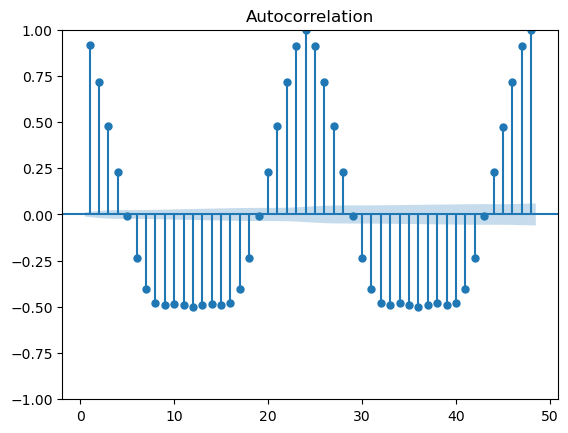

In [67]:
plot_acf(daily_seaonality_diff1, lags=48, zero=False, alpha=0.01);

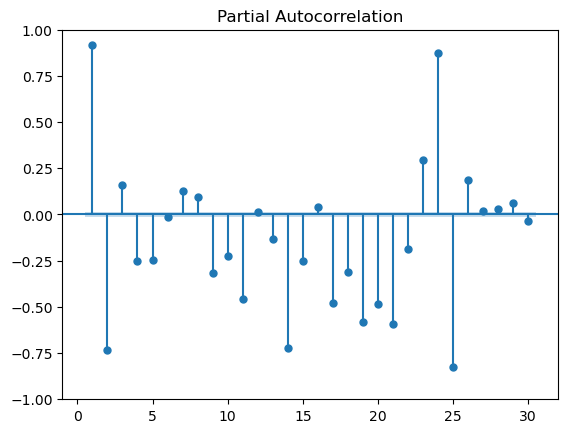

In [68]:
plot_pacf(daily_seaonality_diff1, lags=30, method='ywm', zero=False, alpha=0.01);

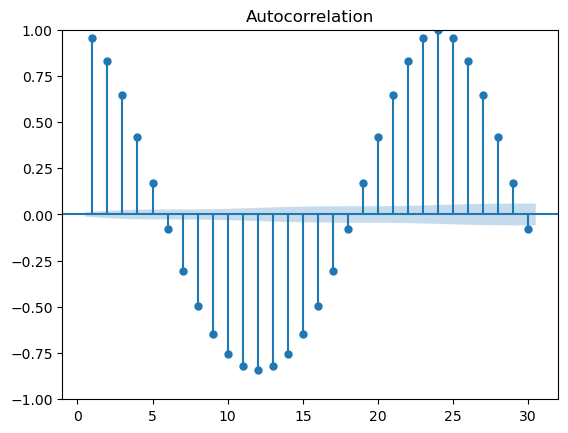

In [69]:
plot_acf(decomp_daily.seasonal, lags=30, zero=False, alpha=0.01);

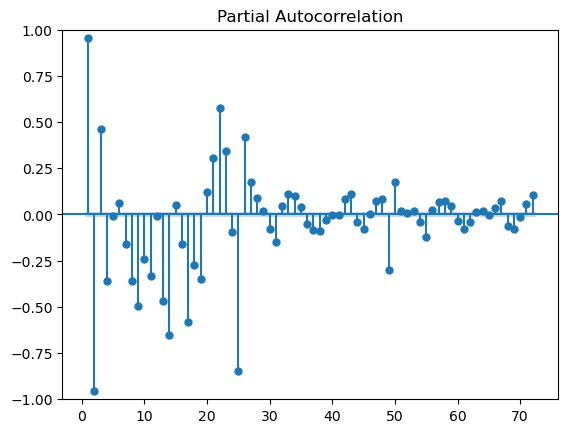

In [70]:
plot_pacf(decomp_daily.seasonal, lags=72, zero=False, method='ywm', alpha=0.01);

Obviously there are multiple seasonalities and we will also have alook at the weekly seasonality in the following cells.
The statsmodels function MSTL for such anaysis is quiye broken as of now and would have made our job easier.

In [71]:
decomp_weekly = seasonal_decompose(df['demand'], model='multiplicative', period=24*7)

In [72]:
plt_window_weekly = plotwindow(decomp_weekly, str(24*7*3)+'H')

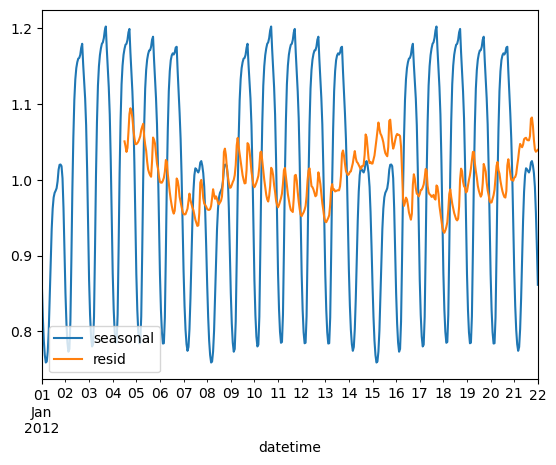

In [73]:
plt_window_weekly.plot()

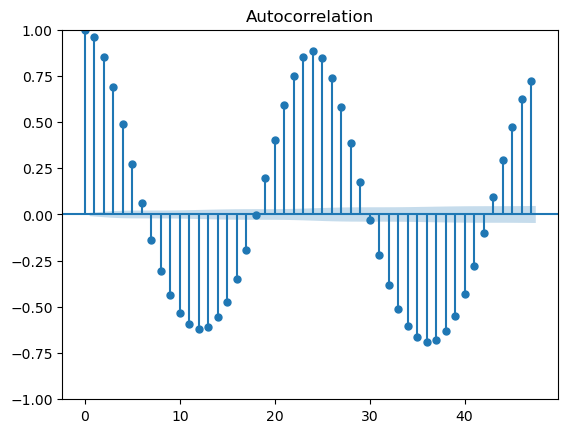

In [74]:
plot_acf(decomp_weekly.seasonal);

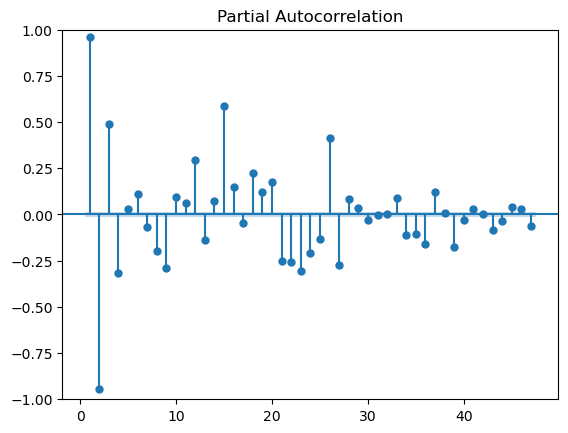

In [75]:
plot_pacf(decomp_weekly.seasonal, method='ywm', zero=False, alpha=0.01);

Remember that you can figure out the autoregressive parameter (p) by looking at the PACF plot when the ACF plot shows infinite series or sinusoidal pattern. This kind of pattern in the ACF plot implies seasonality or periodicity of some kind.
We can further look at the seasonal component
Looking at the PACF and ACF graphs above we can create an ARIMA model with the following parameters:

In [37]:
from sklearn.metrics import mean_absolute_percentage_error, mean_absolute_error

In [38]:
def get_mape(y_true, y_pred):
    '''Takes true values and predicted values to return mean absoulte error percentage 
        in terms of percent values
    '''
    return mean_absolute_percentage_error(y_true, y_pred)*100

In [39]:
val_split_point, test_split_point = df.index[-24*365], df.index[-24*7]

In [35]:
df_train = df.loc[: val_split_point, :]
df_val   = df.loc[val_split_point:test_split_point, :]
df_test  = df.loc[test_split_point:, :]

In [40]:
from skforecast.model_selection_statsmodels import grid_search_sarimax

In [43]:
param_grid = {'order': [
                        (2,0,0),
                        (1,0,0),
                        ],
             'seasonal_order': [
                                (1,1,0,24),
                                ],
             'trend': ['c', 't']
             }

results_grid = grid_search_sarimax(
                   y = df.loc[:test_split_point, 'demand'],
                   param_grid = param_grid,
                   initial_train_size = len(df.loc[:val_split_point]),
                   fixed_train_size = True,
                   steps = 24,
                   metric = get_mape,
                   refit = False,
                   verbose = True,
                   fit_kwargs = {'maxiter': 200, 'disp': 0}
               )

results_grid

root       INFO  Number of models compared: 4
  0%|                                                               | 0/4 [00:00<?, ?it/s]c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


Number of observations used for training: 40393
Number of observations used for backtesting: 8592
    Number of folds: 358
    Number of steps per fold: 24


 25%|█████████████▌                                        | 1/4 [03:49<11:27, 229.02s/it]c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


Number of observations used for training: 40393
Number of observations used for backtesting: 8592
    Number of folds: 358
    Number of steps per fold: 24


 50%|███████████████████████████                           | 2/4 [06:01<05:44, 172.01s/it]c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


Number of observations used for training: 40393
Number of observations used for backtesting: 8592
    Number of folds: 358
    Number of steps per fold: 24


 75%|████████████████████████████████████████▌             | 3/4 [10:11<03:27, 207.94s/it]c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


Number of observations used for training: 40393
Number of observations used for backtesting: 8592
    Number of folds: 358
    Number of steps per fold: 24


100%|██████████████████████████████████████████████████████| 4/4 [13:47<00:00, 206.94s/it]


,params,metric,order,seasonal_order,trend
2,"{'order': (1, 0, 0), 'seasonal_order': (1, 1, ...",5.656379,"(1, 0, 0)","(1, 1, 0, 24)",c
3,"{'order': (1, 0, 0), 'seasonal_order': (1, 1, ...",5.665439,"(1, 0, 0)","(1, 1, 0, 24)",t
1,"{'order': (2, 0, 0), 'seasonal_order': (1, 1, ...",5.771180,"(2, 0, 0)","(1, 1, 0, 24)",t
0,"{'order': (2, 0, 0), 'seasonal_order': (1, 1, ...",6.330726,"(2, 0, 0)","(1, 1, 0, 24)",c


In [44]:
param_grid = {'order': [
                        # (2,0,0),
                        (1,0,0),
                        ],
             'seasonal_order': [
                                (1,0,0,24),
                                (2,0,0,24),
                                ],
             'trend': ['c', 't']
             }

results_grid = grid_search_sarimax(
                   y = df.loc[:test_split_point, 'demand'],
                   param_grid = param_grid,
                   initial_train_size = len(df.loc[:val_split_point]),
                   fixed_train_size = True,
                   steps = 24,
                   metric = get_mape,
                   refit = False,
                   verbose = True,
                   fit_kwargs = {'maxiter': 200, 'disp': 0}
               )

results_grid

root       INFO  Number of models compared: 4
  0%|                                                               | 0/4 [00:00<?, ?it/s]c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


Number of observations used for training: 40393
Number of observations used for backtesting: 8592
    Number of folds: 358
    Number of steps per fold: 24


 25%|█████████████▌                                        | 1/4 [02:04<06:13, 124.54s/it]c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


Number of observations used for training: 40393
Number of observations used for backtesting: 8592
    Number of folds: 358
    Number of steps per fold: 24


 50%|███████████████████████████                           | 2/4 [03:48<03:44, 112.16s/it]c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


Number of observations used for training: 40393
Number of observations used for backtesting: 8592
    Number of folds: 358
    Number of steps per fold: 24


 75%|████████████████████████████████████████▌             | 3/4 [12:52<05:09, 309.54s/it]c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


Number of observations used for training: 40393
Number of observations used for backtesting: 8592
    Number of folds: 358
    Number of steps per fold: 24


100%|██████████████████████████████████████████████████████| 4/4 [16:42<00:00, 250.64s/it]


,params,metric,order,seasonal_order,trend
0,"{'order': (1, 0, 0), 'seasonal_order': (1, 0, ...",5.621392,"(1, 0, 0)","(1, 0, 0, 24)",c
1,"{'order': (1, 0, 0), 'seasonal_order': (1, 0, ...",5.847004,"(1, 0, 0)","(1, 0, 0, 24)",t
3,"{'order': (1, 0, 0), 'seasonal_order': (2, 0, ...",5.849411,"(1, 0, 0)","(2, 0, 0, 24)",t
2,"{'order': (1, 0, 0), 'seasonal_order': (2, 0, ...",8.230500,"(1, 0, 0)","(2, 0, 0, 24)",c


In [47]:
from skforecast.model_selection_statsmodels import backtesting_sarimax

In [59]:
metric, predictions_backtest = backtesting_sarimax(
                                    y = df.loc[:test_split_point, 'demand'],
                                    order = (1, 0, 0),
                                    trend='c',
                                    seasonal_order = (1, 0, 0, 24),
                                    initial_train_size = len(df.loc[:val_split_point]),
                                    fixed_train_size = False,
                                    steps = 24,
                                    metric = get_mape,
                                    refit = False,
                                    verbose = True,
                                    fit_kwargs = {'maxiter': 200, 'disp': 0}
                               )

Number of observations used for training: 40393
Number of observations used for backtesting: 8592
    Number of folds: 358
    Number of steps per fold: 24


c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


In [61]:
metric

5.621392148717084

#### Check using the autocorr function and confirm what the pacf plot above shows us

In [48]:
demand_autocorr = pd.DataFrame(zip(range(1,50), [df['demand'].autocorr(i) for i in range(1,50)]),
                               columns=['lag', 'autocorr']
                               )

In [49]:
demand_autocorr[(demand_autocorr.autocorr>=0.5)&(demand_autocorr.lag>=24)].sort_values('autocorr', ascending=False)

,lag,autocorr
23,24,0.898888
24,25,0.877939
25,26,0.825111
47,48,0.786545
46,47,0.772364
48,49,0.767390
26,27,0.748124
45,46,0.728105
44,45,0.660706
27,28,0.655519


In [50]:
imp_demand_lags = demand_autocorr.loc[(demand_autocorr.autocorr>=0.5)&(demand_autocorr.lag>=24), 'lag'].tolist()

### Feature Engineering

In [51]:
def create_lag_features(df, col, lag):
    df[col+'_lag'+str(lag)] = df[col].shift(lag)

In [52]:
weather_features = ['temperature', 'precipTime', 'precipDepth', 'snowDepth', 'precipDepth/precipTime']

In [53]:
for col in weather_features:
    create_lag_features(df, col, 24)

In [54]:
def get_lagged_features(df):
    return [col for col in df.columns if '_lag' in col]

In [55]:
for lag in imp_demand_lags:
    create_lag_features(df, 'demand', lag)

In [56]:
for lag in imp_demand_lags:
    create_lag_features(df, 'temperature', lag)

In [57]:
df.dropna(inplace=True)

In [58]:
predictors = get_lagged_features(df)

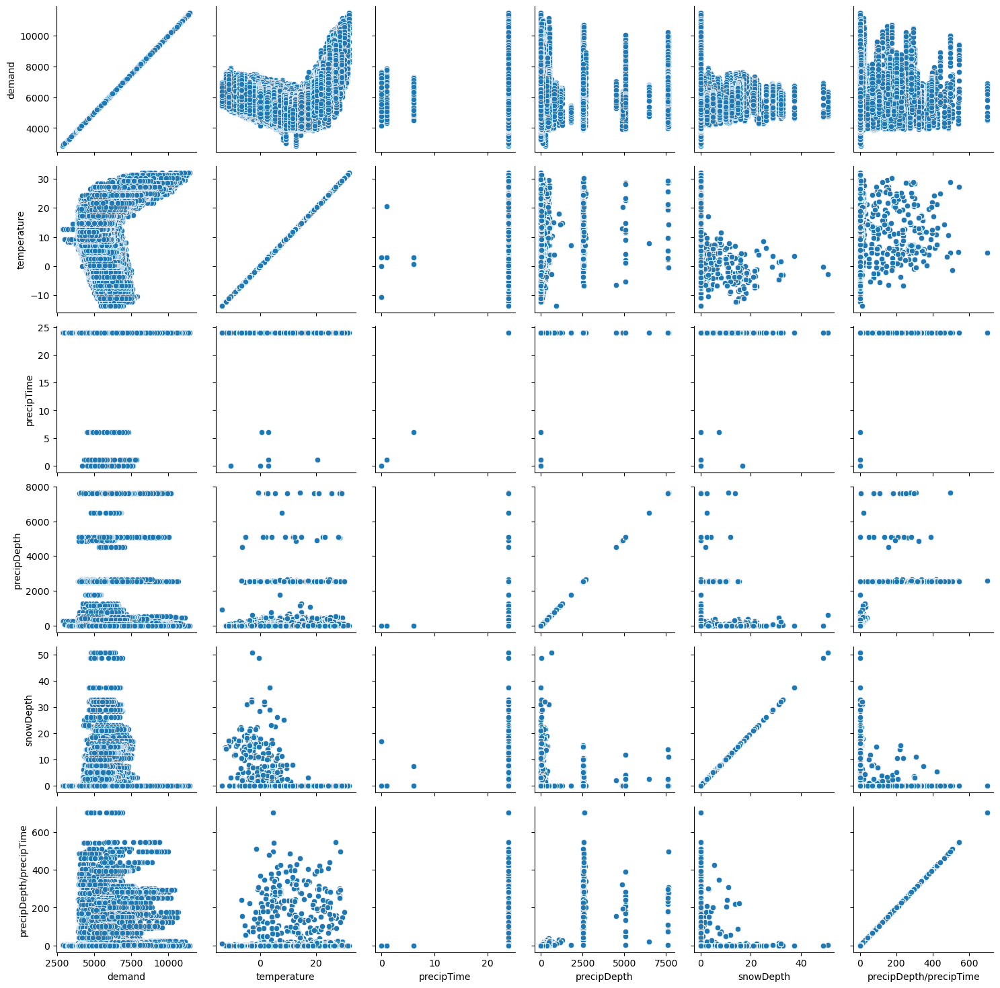

In [81]:
g = sns.PairGrid(df[['demand']+weather_features])
g.map(sns.scatterplot)

C:\Users\Satya\AppData\Local\Temp\ipykernel_16468\58359773.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr())


<AxesSubplot: >

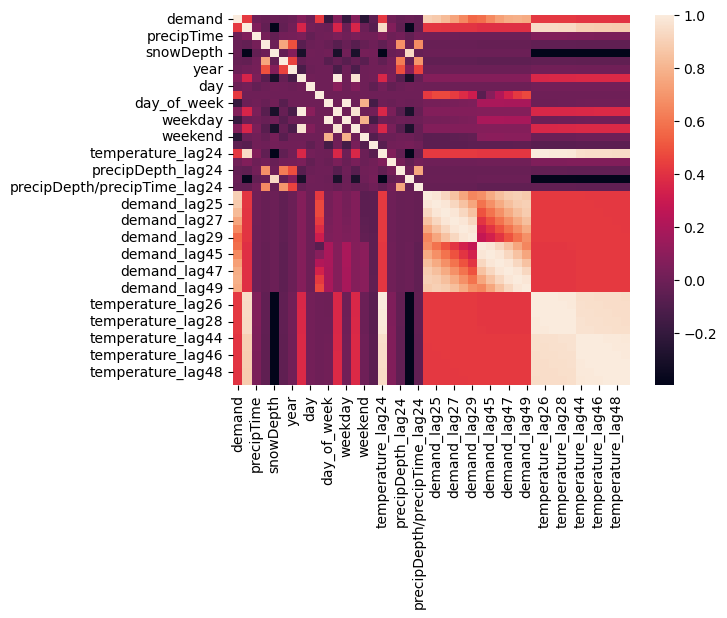

In [74]:
sns.heatmap(df.corr())

In [59]:
from sklearn.feature_selection import mutual_info_regression

In [60]:
def make_mi_scores(X, y, discrete_features):
    '''
    Calculates Mutual Information Score for a given Target variable and List of Features
    
    Args:
        X: DataFrame of Features
        y: Array or Dataframe consisting of Target Variables

    '''
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values()
    return mi_scores

In [77]:
discrete_features = df.drop(['demand', 'new_datetime', 'timeStamp', 'date', 'time']+weather_features, axis=1).dtypes == int

In [78]:
mi_score = make_mi_scores(df.drop(['demand', 'new_datetime', 'timeStamp', 'date', 'time']+weather_features, axis=1), df['demand'], discrete_features)

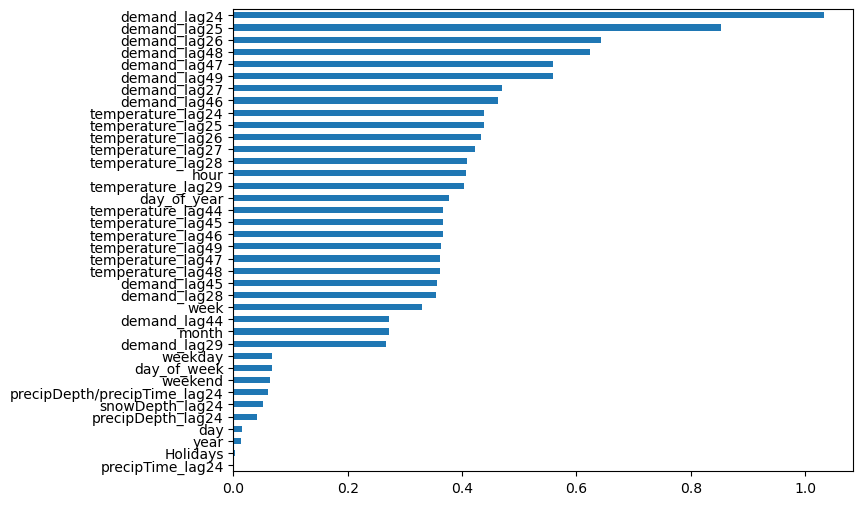

In [79]:
plt.figure(figsize=(8,6))
mi_score.plot.barh();

In [61]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import OneHotEncoder

In [62]:
def sin_transformer(period):
    return FunctionTransformer(lambda x: np.sin(x / period * 2 * np.pi))

def cos_transformer(period):
    return FunctionTransformer(lambda x: np.cos(x / period * 2 * np.pi))

In [63]:
df["hour_sin"] = sin_transformer(24).fit_transform(df["hour"])
df["hour_cos"] = cos_transformer(24).fit_transform(df["hour"])

In [64]:
df["month_sin"] = sin_transformer(12).fit_transform(df["month"])
df["month_cos"] = cos_transformer(12).fit_transform(df["month"])

In [65]:
df["week_sin"] = sin_transformer(53).fit_transform(df["week"])
df["week_cos"] = cos_transformer(53).fit_transform(df["week"])

In [66]:
trig_dt_cols = [col for col in df.columns if (('cos' in col)|('sin' in col))]

In [67]:
ohe = OneHotEncoder(sparse_output=False, handle_unknown="ignore")

In [68]:
ohe_dt_transformer = ColumnTransformer(transformers=[('ohe_datetime', ohe, ['hour', 'month', 'day', 'day_of_week'])])

In [69]:
ohe_dt_transformer.set_output(transform='pandas')

ColumnTransformer(transformers=[('ohe_datetime',
                                 OneHotEncoder(handle_unknown='ignore',
                                               sparse_output=False),
                                 ['hour', 'month', 'day', 'day_of_week'])])

In [70]:
df = df.join(ohe_dt_transformer.fit_transform(df))

In [71]:
ohe_cols = list(ohe_dt_transformer.get_feature_names_out())

In [72]:
# Lets get rid of any irrelevant or unusable features for the task of direct multi-step forecasting

data = df.drop(['new_datetime', 'timeStamp', 'date', 'time']+weather_features, axis=1)

In [73]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso, Ridge, ElasticNet

In [74]:
from skforecast.model_selection import grid_search_forecaster
from skforecast.model_selection import backtesting_forecaster
from skforecast.ForecasterAutoregDirect import ForecasterAutoregDirect

In [75]:
end_train = val_split_point
end_validation = test_split_point
data_train = data.loc[: end_train, :]
data_val   = data.loc[end_train:end_validation, :]
data_test  = data.loc[end_validation:, :]

In [112]:
exog_cols = datetime_features+predictors

In [77]:
data.index.freq = 'H'

In [78]:
data.index.freq

<Hour>

In [79]:
def run_grid_search(reg, param_grid, exog_data=None, scaler=None, steps=24, lags_grid=imp_demand_lags, **kwargs):
    forecaster = ForecasterAutoregDirect(
                regressor     = reg,
                transformer_y = scaler,
                steps         = steps,
                lags          = list(range(steps, steps+6))
             )
    lags_grid = [lags_grid, list(range(steps, steps+6))]
    
    grid_search_args = {'refit': False,
                        'fixed_train_size' : False,
                        'return_best' : True,
                        'verbose' : False
                        }

    if kwargs:
        grid_search_args.update(kwargs)
    print(kwargs)
    results_grid = grid_search_forecaster(
                    forecaster         = forecaster,
                    y                  = data.loc[:end_validation, 'demand'],
                    exog               = exog_data,
                    param_grid         = param_grid,
                    lags_grid          = lags_grid,
                    steps              = steps,
                    metric             = get_mape,
                    initial_train_size = len(data.loc[:end_train]),
                    **grid_search_args
                )
    return results_grid

In [82]:
exog1_cols = datetime_features

In [83]:
exog2_cols = datetime_features+ohe_cols

In [84]:
exog3_cols = exog2_cols + trig_dt_cols

In [85]:
exog4_cols = [col for col in ohe_cols if(('hour' in col)|('month' in col)|('day_of_week' in col))]

In [86]:
exog5_cols =  [col for col in ohe_cols if(('month' in col)|('day_of_week' in col))]

In [100]:
exog6_cols = datetime_features + trig_dt_cols+ exog4_cols + predictors

In [89]:
exog7_cols = exog3_cols + predictors

In [112]:
discrete_features = data[exog7_cols].dtypes == int

In [113]:
mi_score_new = make_mi_scores(data[exog7_cols], data['demand'], discrete_features)

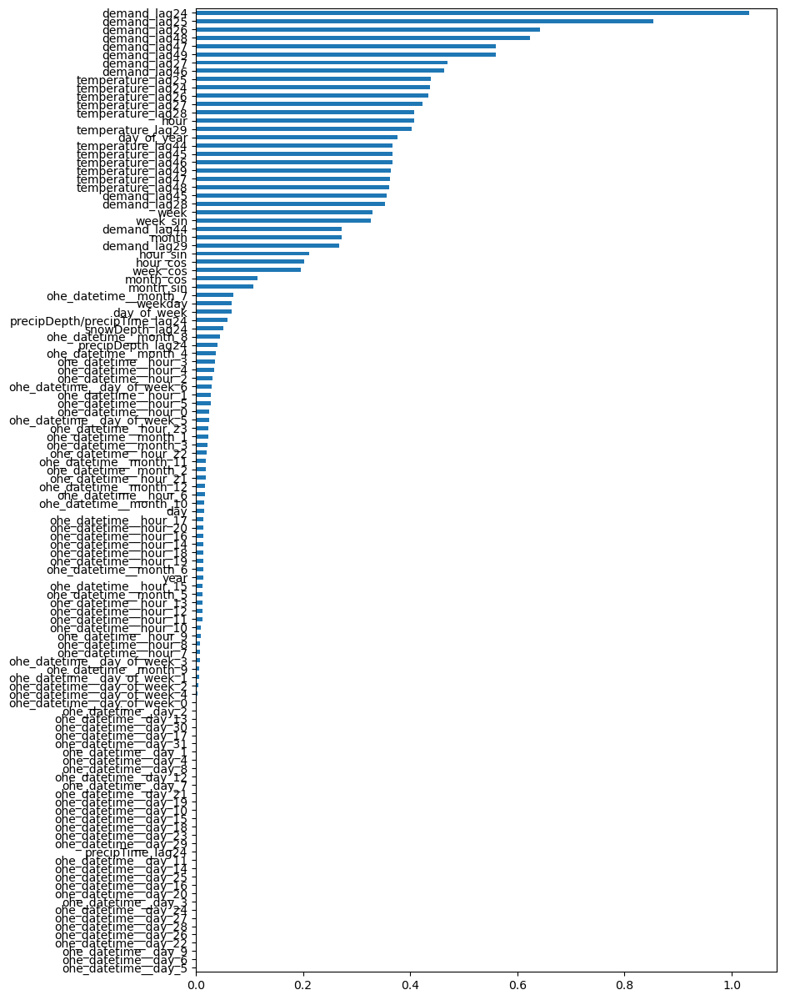

In [117]:
plt.figure(figsize=(9,15))
mi_score_new.plot.barh();

In [131]:
run_grid_search(ElasticNet(random_state=123), {'alpha': [1,10,15],
                                               'l1_ratio': np.arange(0.40,1.00,0.10),
                                               'tol': [
                                                       0.0001,
                                                       0.001
                                                       ],
                                               'max_iter': [10000]
                                               },
                data.loc[:end_validation, exog6_cols], StandardScaler()
)

{}
Number of models compared: 72.


loop lags_grid: 100%|███████████████████████████████████| 2/2 [1:07:15<00:00, 2017.72s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 29 44 45 46 47 48 49] 
  Parameters: {'alpha': 10, 'l1_ratio': 0.4, 'max_iter': 10000, 'tol': 0.001}
  Backtesting metric: 6.270141069105926



,lags,params,get_mape,alpha,l1_ratio,max_iter,tol
13,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 10, 'l1_ratio': 0.4, 'max_iter': 100...",6.270141,10.0,0.4,10000.0,0.0010
49,"[24, 25, 26, 27, 28, 29]","{'alpha': 10, 'l1_ratio': 0.4, 'max_iter': 100...",6.270706,10.0,0.4,10000.0,0.0010
12,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 10, 'l1_ratio': 0.4, 'max_iter': 100...",6.271253,10.0,0.4,10000.0,0.0001
48,"[24, 25, 26, 27, 28, 29]","{'alpha': 10, 'l1_ratio': 0.4, 'max_iter': 100...",6.271786,10.0,0.4,10000.0,0.0001
51,"[24, 25, 26, 27, 28, 29]","{'alpha': 10, 'l1_ratio': 0.5, 'max_iter': 100...",6.349623,10.0,0.5,10000.0,0.0010
...,...,...,...,...,...,...,...
5,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 1, 'l1_ratio': 0.6, 'max_iter': 1000...",6.515670,1.0,0.6,10000.0,0.0010
39,"[24, 25, 26, 27, 28, 29]","{'alpha': 1, 'l1_ratio': 0.5, 'max_iter': 1000...",6.516703,1.0,0.5,10000.0,0.0010
38,"[24, 25, 26, 27, 28, 29]","{'alpha': 1, 'l1_ratio': 0.5, 'max_iter': 1000...",6.516912,1.0,0.5,10000.0,0.0001
3,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 1, 'l1_ratio': 0.5, 'max_iter': 1000...",6.517562,1.0,0.5,10000.0,0.0010


In [95]:
run_grid_search(ElasticNet(random_state=123), {'alpha': [1,10,15,20],
                                               'l1_ratio': np.arange(0.40,1.00,0.10),
                                            #    'tol': [0.0001,0.001]
                                               'max_iter':[10000]
                                               },
                data.loc[:end_validation, trig_dt_cols+exog5_cols+predictors], StandardScaler()
)

Number of models compared: 48.


loop lags_grid: 100%|██████████████████████████████████████| 2/2 [26:38<00:00, 799.40s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 29 44 45 46 47 48 49] 
  Parameters: {'alpha': 10, 'l1_ratio': 0.4, 'max_iter': 10000}
  Backtesting metric: 6.271253249232414



,lags,params,get_mape,alpha,l1_ratio,max_iter
30,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 10, 'l1_ratio': 0.4, 'max_iter': 10000}",6.271253,10.0,0.4,10000.0
6,"[24, 25, 26, 27, 28, 29]","{'alpha': 10, 'l1_ratio': 0.4, 'max_iter': 10000}",6.271786,10.0,0.4,10000.0
7,"[24, 25, 26, 27, 28, 29]","{'alpha': 10, 'l1_ratio': 0.5, 'max_iter': 10000}",6.351024,10.0,0.5,10000.0
31,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 10, 'l1_ratio': 0.5, 'max_iter': 10000}",6.351203,10.0,0.5,10000.0
8,"[24, 25, 26, 27, 28, 29]","{'alpha': 10, 'l1_ratio': 0.6, 'max_iter': 10000}",6.354762,10.0,0.6,10000.0
12,"[24, 25, 26, 27, 28, 29]","{'alpha': 15, 'l1_ratio': 0.4, 'max_iter': 10000}",6.354781,15.0,0.4,10000.0
32,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 10, 'l1_ratio': 0.6, 'max_iter': 10000}",6.354958,10.0,0.6,10000.0
36,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 15, 'l1_ratio': 0.4, 'max_iter': 10000}",6.354976,15.0,0.4,10000.0
9,"[24, 25, 26, 27, 28, 29]","{'alpha': 10, 'l1_ratio': 0.7, 'max_iter': 10000}",6.359229,10.0,0.7,10000.0
33,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 10, 'l1_ratio': 0.7, 'max_iter': 10000}",6.359419,10.0,0.7,10000.0


In [90]:
from lightgbm import LGBMRegressor

In [102]:
results = run_grid_search(LGBMRegressor(random_state=123),  
                          param_grid = {'n_estimators': [100, 500],
                                        'max_depth': [3, 5, 10],
                                        'learning_rate': [0.01, 0.1]
                                        },
                           exog_data=data.loc[:end_validation, exog1_cols]
                           )

{}
Number of models compared: 24.


loop lags_grid: 100%|██████████████████████████████████████| 2/2 [12:26<00:00, 373.21s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 29 44 45 46 47 48 49] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
  Backtesting metric: 5.2290162121774095



In [104]:
run_grid_search(LGBMRegressor(random_state=123),  
                param_grid = {'n_estimators': [100, 500],
                              'max_depth': [3, 5, 10],
                              'learning_rate': [0.01, 0.1]
                              },
                exog_data=data.loc[:end_validation, exog4_cols]
                )

{}
Number of models compared: 24.


loop lags_grid: 100%|██████████████████████████████████████| 2/2 [13:49<00:00, 414.83s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 29] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 5.261826748225436



,lags,params,get_mape,learning_rate,max_depth,n_estimators
23,"[24, 25, 26, 27, 28, 29]","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",5.261827,0.10,10.0,500.0
9,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",5.268733,0.10,5.0,500.0
21,"[24, 25, 26, 27, 28, 29]","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",5.275236,0.10,5.0,500.0
11,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",5.292469,0.10,10.0,500.0
7,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'learning_rate': 0.1, 'max_depth': 3, 'n_esti...",5.405883,0.10,3.0,500.0
22,"[24, 25, 26, 27, 28, 29]","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",5.429584,0.10,10.0,100.0
10,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",5.464501,0.10,10.0,100.0
19,"[24, 25, 26, 27, 28, 29]","{'learning_rate': 0.1, 'max_depth': 3, 'n_esti...",5.487196,0.10,3.0,500.0
8,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",5.628495,0.10,5.0,100.0
5,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'learning_rate': 0.01, 'max_depth': 10, 'n_es...",5.719273,0.01,10.0,500.0


In [101]:
results = run_grid_search(LGBMRegressor(random_state=123),  
                          param_grid = {'n_estimators': [100, 500],
                                        'max_depth': [3, 5, 10],
                                        'learning_rate': [0.01, 0.1]
                                        },
                           exog_data=data.loc[:end_validation, exog6_cols],
                           )

{}
Number of models compared: 24.


loop lags_grid: 100%|██████████████████████████████████████| 2/2 [25:55<00:00, 777.95s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 29 44 45 46 47 48 49] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 4.060090586236019



In [142]:
results = run_grid_search(LGBMRegressor(random_state=123),  
                          param_grid = {'n_estimators': [100, 500],
                                        'max_depth': [3, 5, 10],
                                        'learning_rate': [0.01, 0.1]
                                        },
                           exog_data=data.loc[:end_validation, exog6_cols+['weekend', 'Holidays']],
                           )

{}
Number of models compared: 24.


loop lags_grid: 100%|██████████████████████████████████████| 2/2 [26:35<00:00, 797.56s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 29 44 45 46 47 48 49] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 3.9584977281753884



In [144]:
exog9_cols = list(set(exog6_cols)-{'temperature_lag26', 'temperature_lag27','temperature_lag28', 'temperature_lag29', 'temperature_lag44', 
                                   'temperature_lag45', 'temperature_lag46', 'temperature_lag47', 'temperature_lag48', 'temperature_lag49'}
                 )

In [145]:
results = run_grid_search(LGBMRegressor(random_state=123),  
                          param_grid = {'n_estimators': [100, 500],
                                        'max_depth': [3, 5, 10],
                                        'learning_rate': [0.01, 0.1]
                                        },
                           exog_data=data.loc[:end_validation, exog9_cols+['weekend', 'Holidays']],
                           )

{}
Number of models compared: 24.


loop lags_grid: 100%|██████████████████████████████████████| 2/2 [21:56<00:00, 658.07s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 29 44 45 46 47 48 49] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 3.981605583316457



In [ ]:
exog10_cols = list(set(exog6_cols)
                #    - {'temperature_lag26', 'temperature_lag27','temperature_lag28', 'temperature_lag29', 'temperature_lag44', 
                #       'temperature_lag45', 'temperature_lag46', 'temperature_lag47', 'temperature_lag48', 'temperature_lag49'}
                  - set([col for col in ohe_cols if('hour' in col)])
                  - set([col for col in exog6_cols if('demand_lag' in col)])
                 )

In [124]:
results = run_grid_search(LGBMRegressor(random_state=123),  
                          param_grid = {'n_estimators': [100, 500],
                                        'max_depth': [3, 5, 10],
                                        'learning_rate': [0.01, 0.1]
                                        },
                           exog_data=data.loc[:end_validation, exog10_cols+['weekend', 'Holidays']],
                           )

{}
Number of models compared: 24.


loop lags_grid: 100%|██████████████████████████████████████| 2/2 [23:33<00:00, 706.86s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 29 44 45 46 47 48 49] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 3.9536701631568776



In [141]:
results = run_grid_search(LGBMRegressor(random_state=123),  
                          param_grid = {'n_estimators': [100, 500],
                                        'max_depth': [3, 5, 10],
                                        'learning_rate': [0.01, 0.1]
                                        },
                           exog_data=data.loc[:end_validation, exog10_cols+['weekend', 'Holidays']],
                           )

{}
Number of models compared: 24.


loop lags_grid: 100%|██████████████████████████████████████| 2/2 [19:17<00:00, 578.73s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 29 44 45 46 47 48 49] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 4.333648273750494



In [139]:
results = run_grid_search(LGBMRegressor(random_state=123),  
                          param_grid = {'n_estimators': [100, 500],
                                        'max_depth': [3, 5, 10],
                                        'learning_rate': [0.01, 0.1]
                                        },
                           exog_data=data.loc[:end_validation, datetime_features+predictors+trig_dt_cols+ohe_cols+['weekend', 'Holidays']],
                           )

{}
Number of models compared: 24.


loop lags_grid: 100%|██████████████████████████████████████| 2/2 [27:55<00:00, 837.85s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 29] 
  Parameters: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 3.9485093457027625



In [263]:
from sklearn.ensemble import RandomForestRegressor

In [110]:
# run_grid_search(RandomForestRegressor(random_state=123),  param_grid = {'n_estimators': [100, 500], 'max_depth': [3, 5, 10]},
#                 exog_data=data.loc[:end_validation, exog_cols]
#                 )